In [1]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import os
import cv2
import pandas as pd

In [2]:
data = pd.read_csv('/kaggle/input/skin-cancer-mnist-ham10000/hmnist_28_28_RGB.csv')
data.head()

,pixel0000,pixel0001,pixel0002,pixel0003,pixel0004,pixel0005,pixel0006,pixel0007,pixel0008,pixel0009,...,pixel2343,pixel2344,pixel2345,pixel2346,pixel2347,pixel2348,pixel2349,pixel2350,pixel2351,label
0,192,153,193,195,155,192,197,154,185,202,...,173,124,138,183,147,166,185,154,177,2
1,25,14,30,68,48,75,123,93,126,158,...,60,39,55,25,14,28,25,14,27,2
2,192,138,153,200,145,163,201,142,160,206,...,167,129,143,159,124,142,136,104,117,2
3,38,19,30,95,59,72,143,103,119,171,...,44,26,36,25,12,17,25,12,15,2
4,158,113,139,194,144,174,215,162,191,225,...,209,166,185,172,135,149,109,78,92,2


In [3]:
y = data['label']
x = data.drop(columns = ['label'])

In [4]:
classes = {
    0: ('akiec', 'Actinic keratoses and intraepithelial carcinomae'),
    1: ('bcc', 'basal cell carcinoma'),
    2: ('bkl', 'benign keratosis-like lesions'),
    3: ('df', 'dermatofibroma'),
    4: ('nv', 'melanocytic nevi'),
    5: ('vasc', 'pyogenic granulomas and hemorrhage'),
    6: ('mel', 'melanoma')
}


Text(0.5, 1.0, 'Frequency Distribution of Classes')

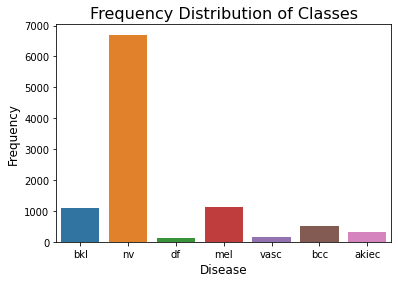

In [5]:
tabular_data = pd.read_csv('/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_metadata.csv')
sns.countplot(x = 'dx', data = tabular_data)
plt.xlabel('Disease', size=12)
plt.ylabel('Frequency', size=12)
plt.title('Frequency Distribution of Classes', size=16)

In [6]:
# As you can see in the above plot that one class is dominating, this will impose a problem while we train
# our model. So in order to over come this we use this over sampling.
from imblearn.over_sampling import RandomOverSampler 
oversample = RandomOverSampler()
x,y  = oversample.fit_resample(x,y)

In [7]:
x = np.array(x).reshape(-1,28,28,3)
print('Shape of X :',x.shape)
# you can see that the size of the dataset is reduced making sure that there is equal number of images 
# from all classes

Shape of X : (46935, 28, 28, 3)


In [8]:
from sklearn.model_selection import train_test_split
x = (x-np.mean(x))/np.std(x)
X_train, X_test, Y_train, Y_test = train_test_split(x,y, test_size=0.2, random_state=1)

In [9]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense, Input
# Create the model
inputs = Input(shape=(28, 28, 3))
x = Conv2D(16, kernel_size=(3, 3), activation='relu', padding='same')(inputs)
x = Conv2D(32, kernel_size=(3, 3), activation='relu')(x)
x = MaxPool2D(pool_size=(2, 2))(x)
x = Conv2D(32, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = Conv2D(64, kernel_size=(3, 3), activation='relu')(x)
x = MaxPool2D(pool_size=(2, 2), padding='same')(x)
x = Flatten()(x)
x = Dense(64, activation='relu')(x)
x = Dense(32, activation='relu')(x)
outputs = Dense(7, activation='softmax')(x)
model = tf.keras.Model(inputs=inputs, outputs=outputs)
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 28, 28, 3)]       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 28, 28, 16)        448       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 26, 26, 32)        4640      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 13, 13, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 13, 13, 32)        9248      
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 11, 11, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 64)          0     

In [10]:
model.compile(loss = 'sparse_categorical_crossentropy',
             optimizer = 'adam',
              metrics = ['accuracy'])

In [11]:
model.fit(X_train,Y_train,validation_split=0.2,batch_size = 128,epochs = 20)

Epoch 1/20
235/235 [==============================] - 5s 9ms/step - loss: 1.5279 - accuracy: 0.3888 - val_loss: 0.8956 - val_accuracy: 0.6632
Epoch 2/20
235/235 [==============================] - 1s 5ms/step - loss: 0.7982 - accuracy: 0.7038 - val_loss: 0.6097 - val_accuracy: 0.7868
Epoch 3/20
235/235 [==============================] - 1s 5ms/step - loss: 0.5066 - accuracy: 0.8206 - val_loss: 0.4006 - val_accuracy: 0.8533
Epoch 4/20
235/235 [==============================] - 1s 5ms/step - loss: 0.3300 - accuracy: 0.8817 - val_loss: 0.3675 - val_accuracy: 0.8732
Epoch 5/20
235/235 [==============================] - 1s 5ms/step - loss: 0.2694 - accuracy: 0.9041 - val_loss: 0.2738 - val_accuracy: 0.8971
Epoch 6/20
235/235 [==============================] - 1s 5ms/step - loss: 0.1836 - accuracy: 0.9381 - val_loss: 0.2538 - val_accuracy: 0.9162
Epoch 7/20
235/235 [==============================] - 1s 5ms/step - loss: 0.1483 - accuracy: 0.9483 - val_loss: 0.1818 - val_accuracy: 0.9391
Epoch 

In [12]:
loss, acc = model.evaluate(X_test, Y_test, verbose=2)

294/294 - 0s - loss: 0.1768 - accuracy: 0.9694


# Evaluating Metrics

In [13]:
y_prob = model.predict(X_test)
y_pred = tf.argmax(y_prob, axis=1).numpy()
y_true = np.copy(Y_test)

In [14]:
from sklearn.metrics import accuracy_score, roc_auc_score, average_precision_score, f1_score
from sklearn.preprocessing import label_binarize
n_classes = y_prob.shape[1]
y_true_bin = label_binarize(y_true, classes=range(n_classes))

In [15]:
auc = roc_auc_score(y_true_bin, y_prob, average='macro', multi_class='ovr')
print(f"AUC: {auc}")

AUC: 0.9963171186160629


In [16]:
map_score = average_precision_score(y_true_bin, y_prob, average='macro')
print(f"Mean Average Precision: {map_score}")

Mean Average Precision: 0.9861065496338279


In [17]:
f1 = f1_score(y_true, y_pred, average='macro')
print(f"F1 Score: {f1}")

F1 Score: 0.9689229428496665


# Model Inference

     |████████████████████████████████| 72 kB 1.2 MB/s  eta 0:00:01
     |████████████████████████████████| 64 kB 2.4 MB/s  eta 0:00:01
     |████████████████████████████████| 104 kB 48.6 MB/s eta 0:00:01
     |████████████████████████████████| 758 kB 39.6 MB/s eta 0:00:01
     |████████████████████████████████| 8.0 MB 34.0 MB/s eta 0:00:01
     |████████████████████████████████| 10.1 MB 62.5 MB/s eta 0:00:01
     |████████████████████████████████| 57 kB 4.7 MB/s  eta 0:00:01
     |████████████████████████████████| 484 kB 56.9 MB/s eta 0:00:01
     |████████████████████████████████| 245 kB 57.1 MB/s eta 0:00:01
     |████████████████████████████████| 118 kB 29.3 MB/s eta 0:00:01
     |████████████████████████████████| 58 kB 6.5 MB/s  eta 0:00:01
  Created wheel for google.colab: filename=google_colab-1.0.0-py2.py3-none-any.whl size=102289 sha256=7b2ba545cd6616890b5c5892e4725bc102b0b92502bc410a70bb465e2656a9dc
  Stored in directory: /root/.cache/pip/wheels/f6/3b/58/f34ea9045a7c69bd56349

/opt/conda/lib/python3.7/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


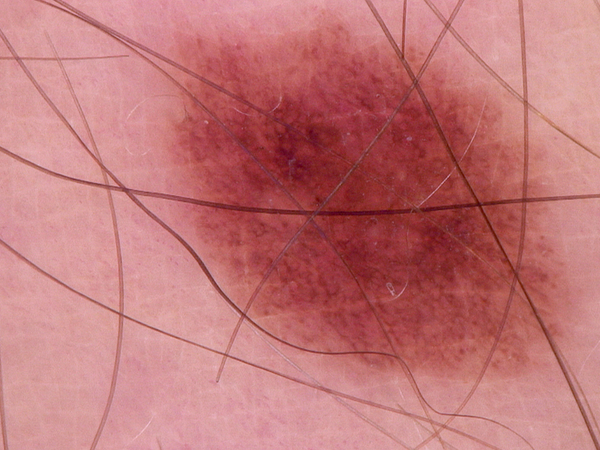

('nv', 'melanocytic nevi')


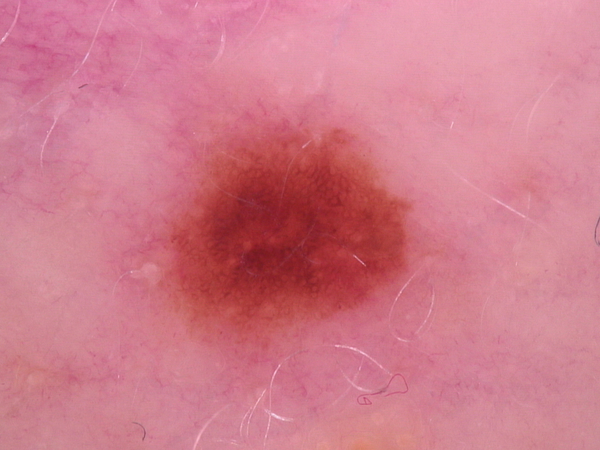

('nv', 'melanocytic nevi')


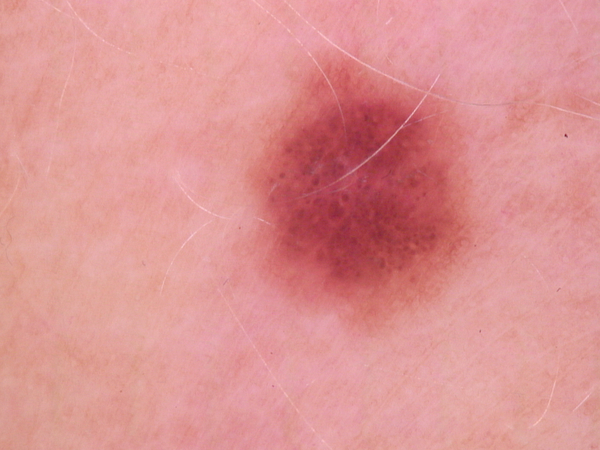

('nv', 'melanocytic nevi')


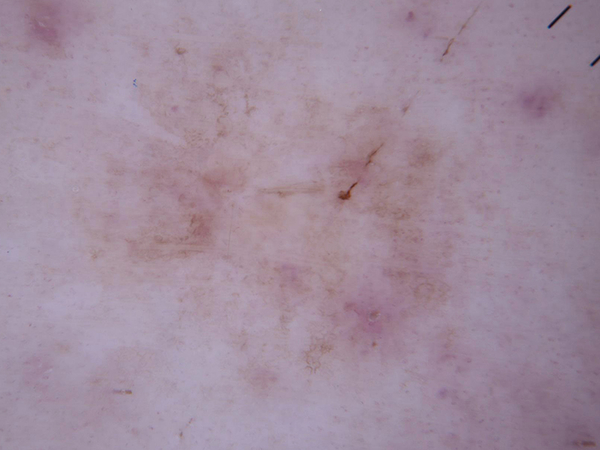

('nv', 'melanocytic nevi')


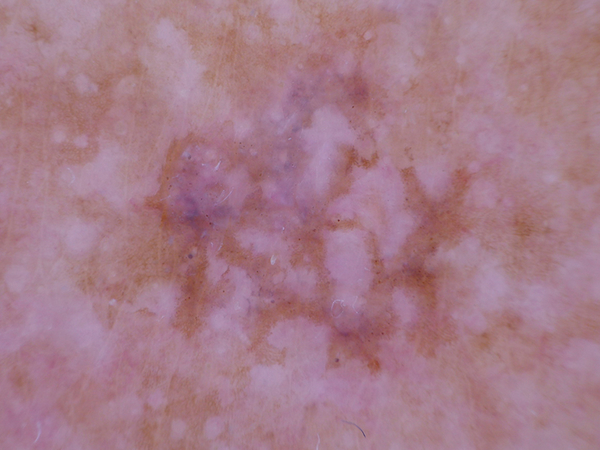

('nv', 'melanocytic nevi')


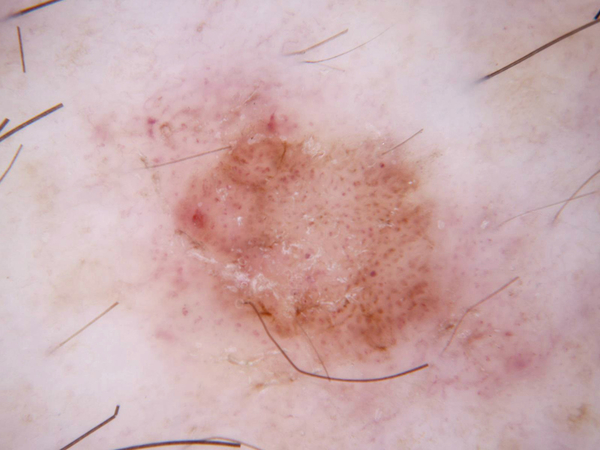

('nv', 'melanocytic nevi')


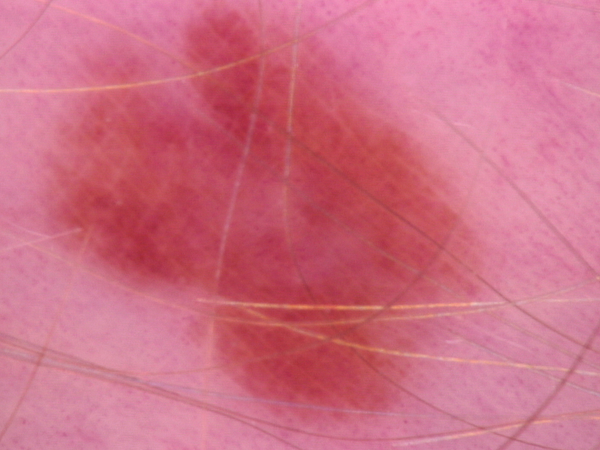

('nv', 'melanocytic nevi')


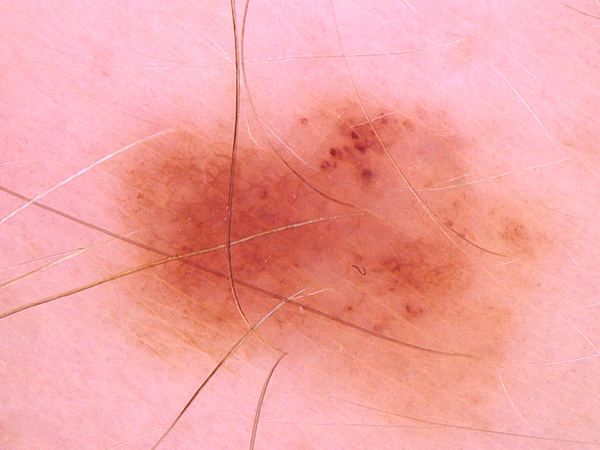

('nv', 'melanocytic nevi')


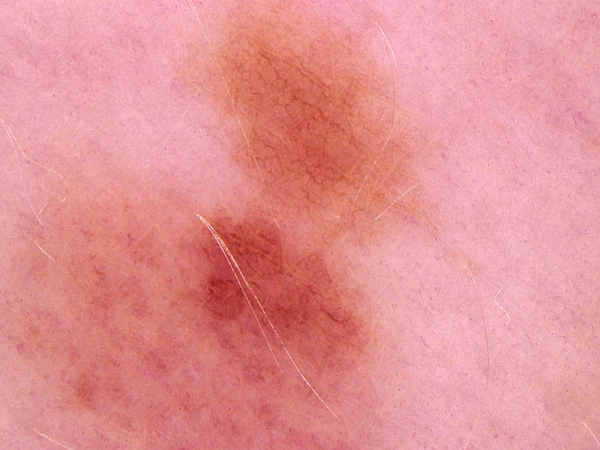

('nv', 'melanocytic nevi')


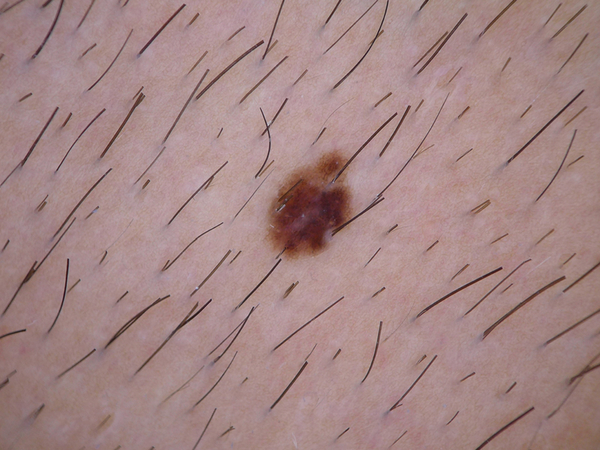

('nv', 'melanocytic nevi')


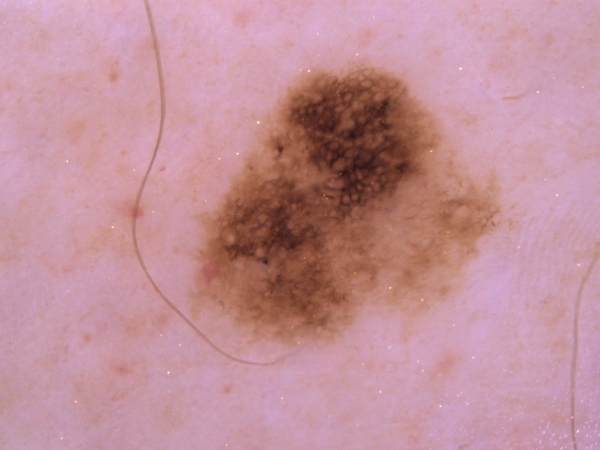

('nv', 'melanocytic nevi')


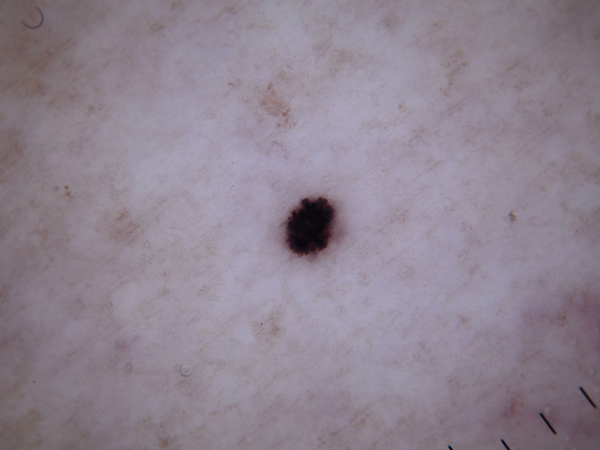

('nv', 'melanocytic nevi')


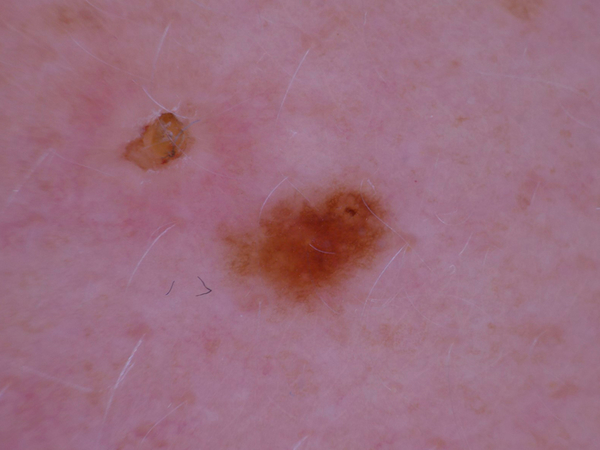

('nv', 'melanocytic nevi')


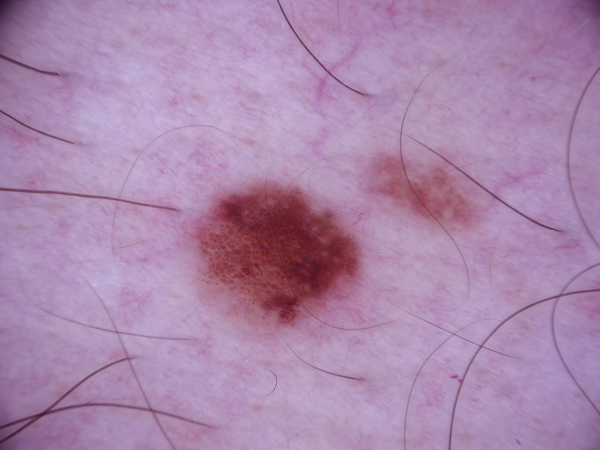

('nv', 'melanocytic nevi')


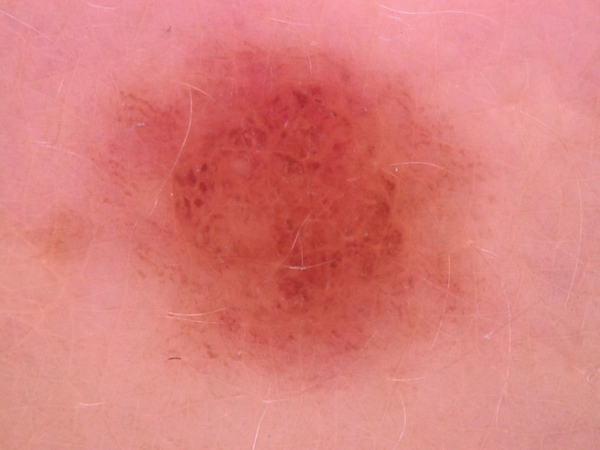

('nv', 'melanocytic nevi')


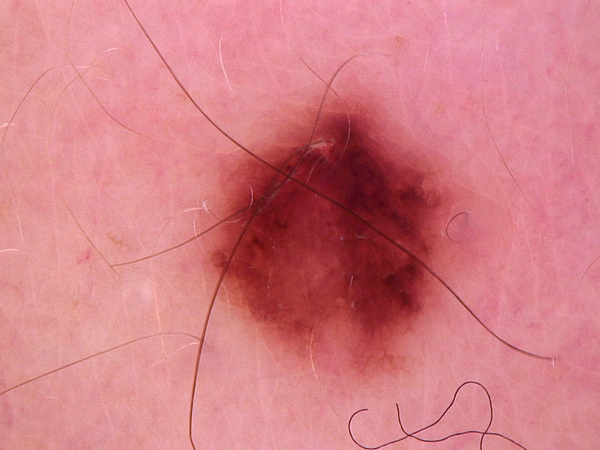

('nv', 'melanocytic nevi')


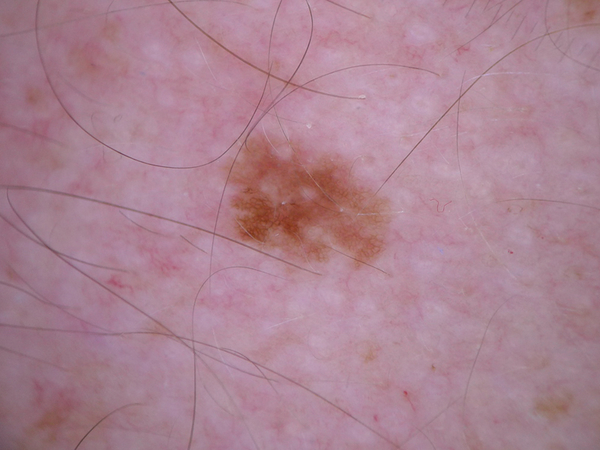

('nv', 'melanocytic nevi')


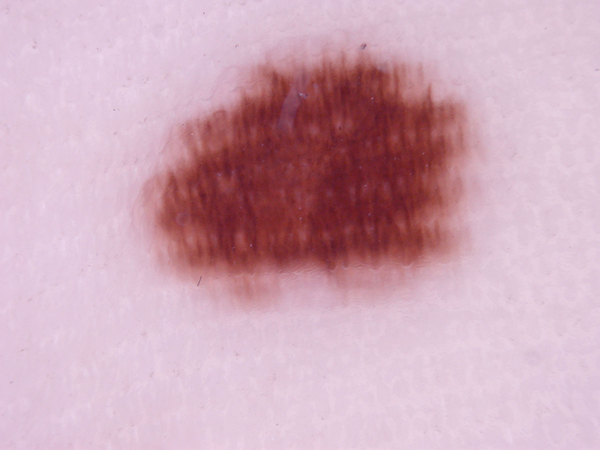

('nv', 'melanocytic nevi')


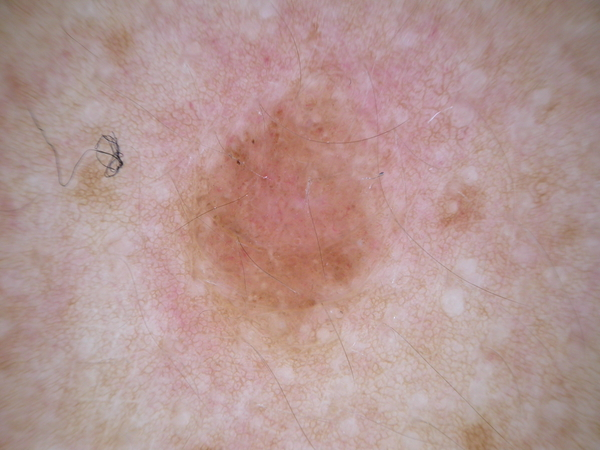

('nv', 'melanocytic nevi')


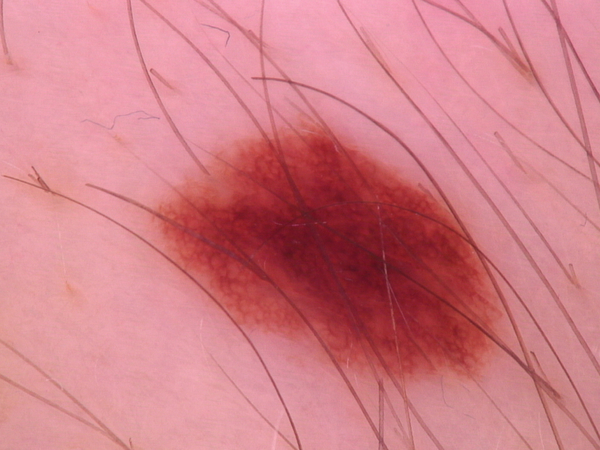

('nv', 'melanocytic nevi')


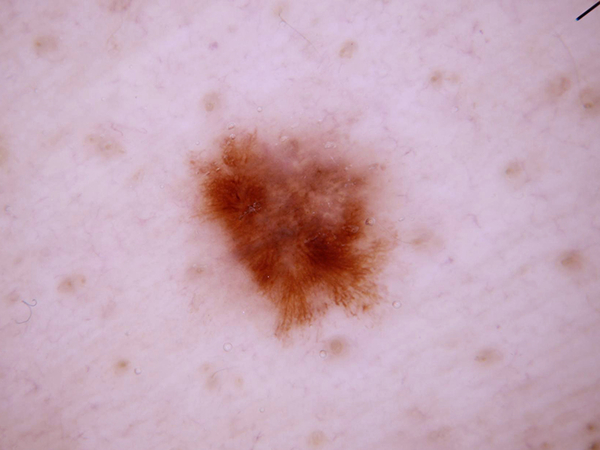

('nv', 'melanocytic nevi')


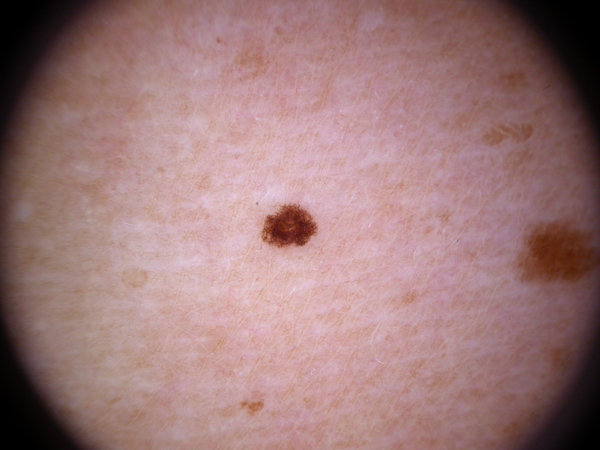

('nv', 'melanocytic nevi')


In [18]:
!pip install google.colab
# predicting on the unseen unlabelled images
from google.colab.patches import cv2_imshow
srcdir = '/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1'
count=0
for temp in os.listdir(srcdir):
    img = cv2.imread(os.path.join(srcdir, temp))
    cv2.imwrite(temp, img)
    cv2_imshow(img)
    img = cv2.resize(img, (28, 28))
    result = model.predict(img.reshape(1, 28, 28, 3))
    max_prob = max(result[0])
    class_ind = list(result[0]).index(max_prob)
    class_name = classes[class_ind]
    print(class_name)
    count+=1
    if count>10:
        break
srcdir = '/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2'
count=0
for temp in os.listdir(srcdir):
    img = cv2.imread(os.path.join(srcdir, temp))
    cv2.imwrite(temp, img)
    cv2_imshow(img)
    img = cv2.resize(img, (28, 28))
    result = model.predict(img.reshape(1, 28, 28, 3))
    max_prob = max(result[0])
    class_ind = list(result[0]).index(max_prob)
    class_name = classes[class_ind]
    print(class_name)
    count+=1
    if count>10:
        break